In [1]:
import importlib
import MonoplottingFunctions
importlib.reload(MonoplottingFunctions)
from MonoplottingFunctions import *

# Image Keypoints

In [2]:
img = readImage_withScale(Path='data/Mountain_cropped.jpg', scalefactor=1)
width_img = img.shape[1]
height_img = img.shape[0]

Image_keypoints = np.loadtxt('data/ORB_imageKeyPoints.out', delimiter=',').round()

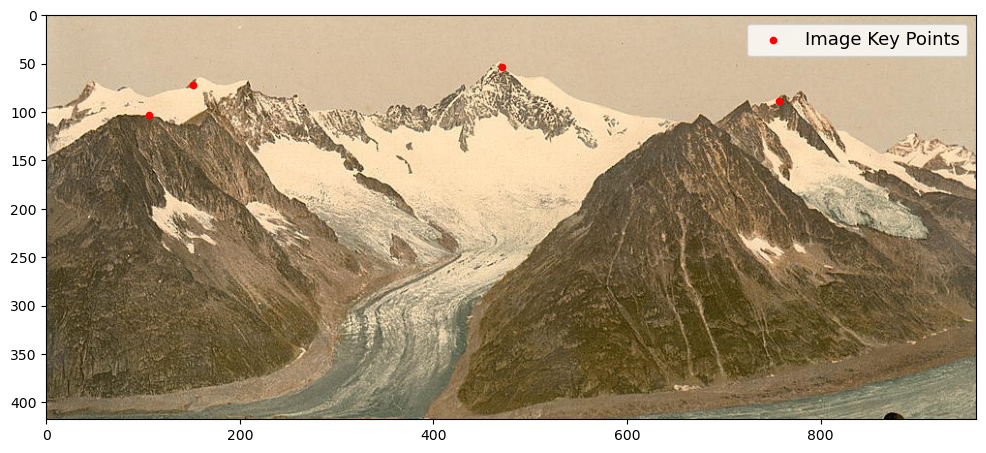

In [4]:
listSelectedImgKeyPnts = np.arange(Image_keypoints.shape[0])
listSelectedImgKeyPnts = [23 , 30, 49, 16]
Selected_Image_keypoints = Image_keypoints[listSelectedImgKeyPnts]

showImg_and_KeyPoints(img, Selected_Image_keypoints, pointfill=True, showLegend=True, labelString='Image Key Points',
                      showPointNumber=False, showGrid=False, pointsize=20, fontsize=13, saveTofile=True, filePath='./Outputs/image_keypoints.png')


# Raster DEM Keypoints

In [7]:
DEM_DataArray, GDAL_GeoTransform = processDEMraster("data/AletschGlacierDEM.tiff")

GeoPointCloud_path = os.path.join('large-size-data/', 'Mountain_PointCloud_no_deletion.out')
DEMPointCloud = createGeoPointCloudfromDEM(filePath='data/AletschGlacierDEM.tiff', outputPath=GeoPointCloud_path, saveoutput=False)

PointCloudVisualizer(PointCloudFilePath=GeoPointCloud_path, width=3024, height=1964)

2025-06-01 23:52:06.962 python[67751:4572125] +[IMKClient subclass]: chose IMKClient_Modern
2025-06-01 23:52:06.962 python[67751:4572125] +[IMKInputSession subclass]: chose IMKInputSession_Modern


In [8]:
DEM_Image_path = os.path.join('data/', 'DEM_Image_Gray_No_deletion.jpg')
if not os.path.isfile(DEM_Image_path):
    createDEMimage('data/AletschGlacierDEM.tiff', DEM_Image_path)
else:
    print(f"The file '{DEM_Image_path}' exists")

The file 'data/DEM_Image_Gray_No_deletion.jpg' exists


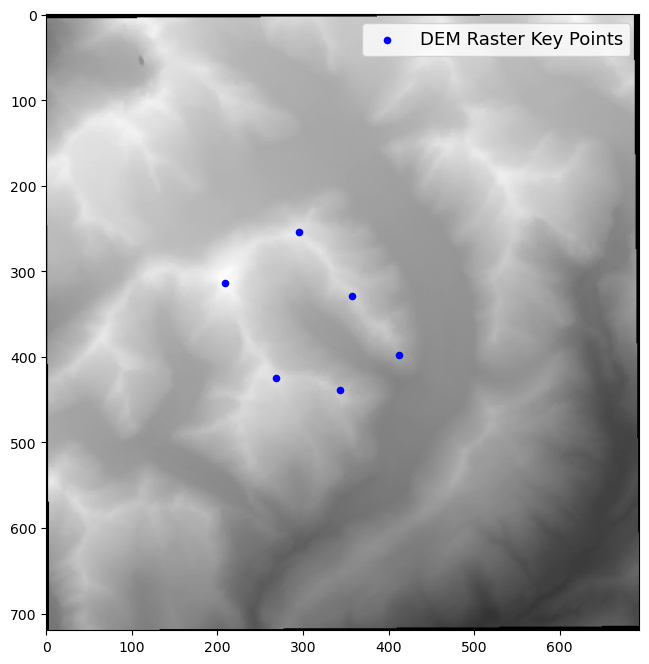

In [9]:
DEM_Image = cv2.imread(DEM_Image_path, cv2.COLOR_BGR2GRAY)

DEM_Raster_keypoint = np.loadtxt('data/DEM_Raster_keypoint.out', delimiter=',').round().astype('int64')
listSelectedDEMKeyPnts = [7 , 17, 20, 21 , 19, 16]
Selected_DEM_Raster_keypoint = DEM_Raster_keypoint[listSelectedDEMKeyPnts]
showImg_and_KeyPoints(DEM_Image, Selected_DEM_Raster_keypoint, pointfill=True, showGrid=False, showLegend=True, labelString='DEM Raster Key Points', fontsize=13,
                      showPointNumber=False, fillcolor='blue', pointsize=20, figuresize=(8,8), colormap='gray',
                      saveTofile=True, filePath='./Outputs/DEM_Raster_keypoints.png')

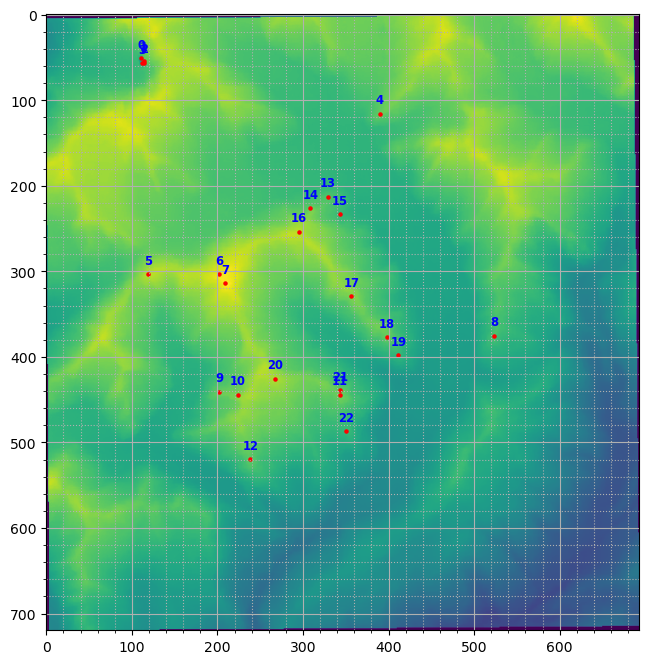

In [10]:
orb_params = {
    "nfeatures": 1000,
    "scaleFactor": 1.9,
    "nlevels": 8
}
keypoints, descriptors = DEMrasterKeypointFinder(DEM_Image, orb_params)

showImg_and_KeyPoints(DEM_Image, keypoints, pointfill=True, showGrid=True, showPointNumber=True,
                      pointsize=5, figuresize=(8,8), colormap='viridis')

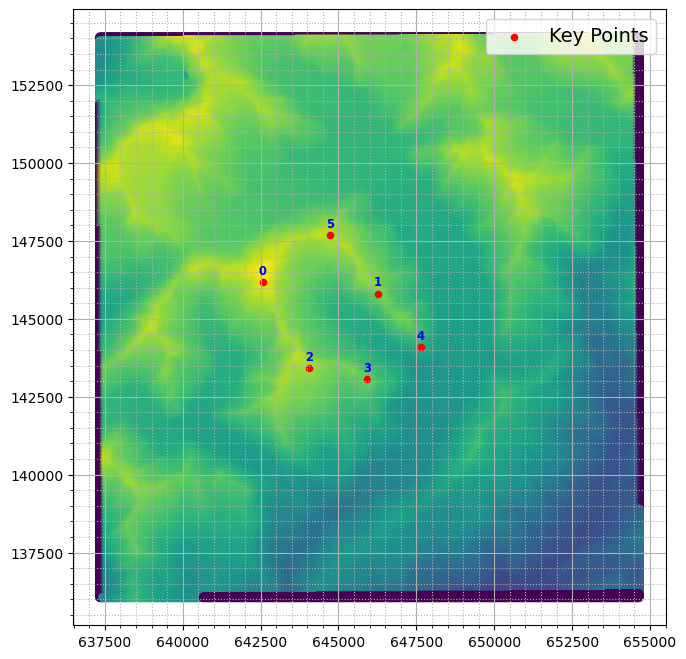

In [11]:
Geo_Keypoints = DEMrasterKeyPointsToGeoKeyPoints(Selected_DEM_Raster_keypoint, DEM_DataArray, GDAL_GeoTransform)
showDEM3D_and_KeyPoints(DEMPointCloud, Geo_Keypoints, pointfill=True, showGrid=True, showPointNumber=True, pointsize=20, figuresize=(8,8), colormap='viridis')

# Optimization

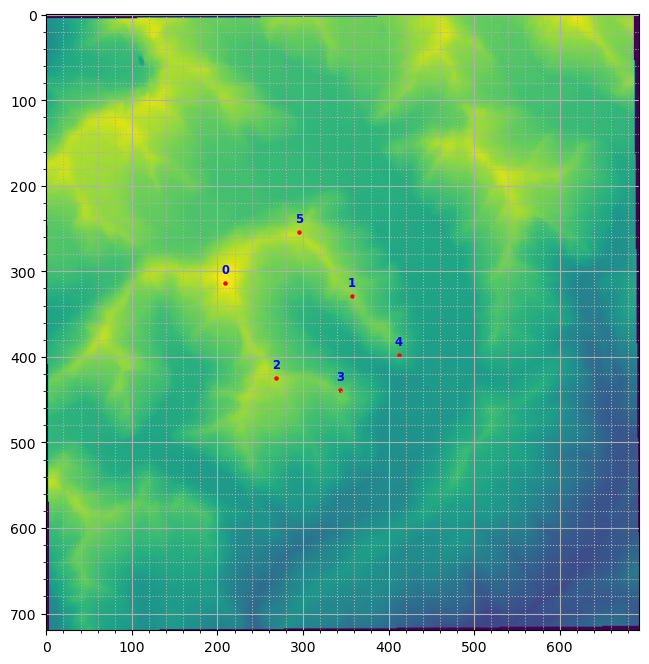

In [12]:
showImg_and_KeyPoints(DEM_Image, Selected_DEM_Raster_keypoint, pointfill=True, showGrid=True, showPointNumber=True,
                      pointsize=5, figuresize=(8,8), colormap='viridis')

selectedGeoKeypoints = DEMrasterKeyPointsToGeoKeyPoints(Selected_DEM_Raster_keypoint, DEM_DataArray, GDAL_GeoTransform)

# showDEM3D_and_KeyPoints(DEMPointCloud, selectedGeoKeypoints,
#                         pointfill=True, showGrid=True, showPointNumber=True, pointsize=5, figuresize=(8,8), colormap='viridis')

In [ ]:
# Pmodel = ProjectModel(659300, 143700, 2900, 260, -60, -1, 25)
# Pmodel = ProjectModel(649323.4946735367, 142744.31005438883, 2805.999091620659, 269.69094211, -62.23, -0.369, 26.45)
Pmodel = ProjectModel(649260.6053860402 , 142843.93262105953 , 2805.729165041062 , 269.94022416454516 , -62.871496315748 , -0.490619456426952 , 27.16232788778088)

In [16]:
LRAdap = .01

optimizer = torch.optim.Adadelta(Pmodel.parameters(), lr=LRAdap, rho=0.9, eps=1e-06)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10000], gamma=0.5)

In [17]:
%%time
import time
t0 = time.time()
loss_history = []
interval_check = 2000
plot_interval = 10000

t=0
while True:

    loss_P = Pmodel(img, selectedGeoKeypoints, Selected_Image_keypoints)
    loss_history.append(loss_P.item())

    if t % interval_check == 0:
        print(Pmodel.Loss.detach().numpy().round(2))

    # if t % plot_interval == 0:
    #     projectedPoints = Pmodel.uv_final.detach().numpy()
    #     showImg_and_KeyPoints_and_projectedPoints(img, 
    #     Selected_Image_keypoints,
    #     projectedPoints,
    #     showPointNumber=True, pointsize=60)

    # Zero gradients, perform a backward pass, and update the weights.
    optimizer.zero_grad()
    loss_P.backward()
    optimizer.step()
    t+=1
    # scheduler.step()

loss_history = np.array(loss_history)

t1 = time.time()
RunTime = t1-t0
print("Running Time", RunTime)

75.35
75.18
75.15


KeyboardInterrupt: 

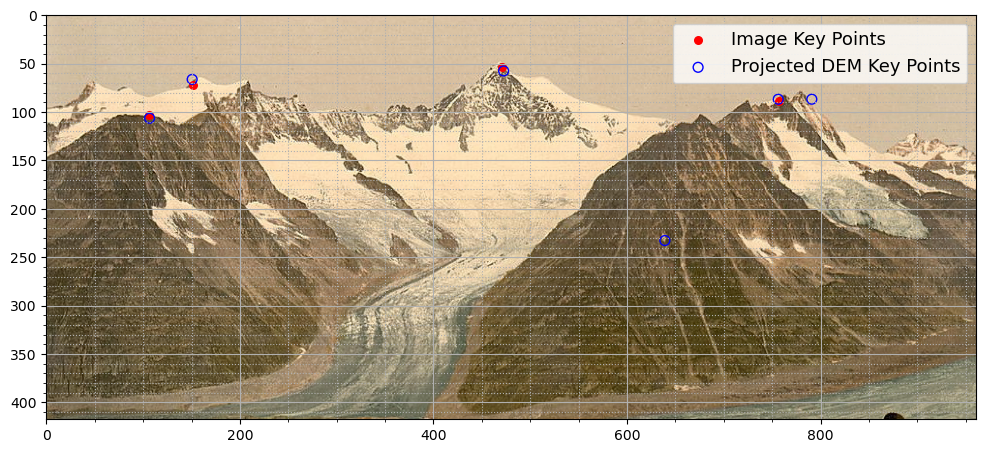

In [32]:
projectedPoints = Pmodel.uv_final.detach().numpy()

showImg_and_KeyPoints_and_projectedPoints(img, 
        Selected_Image_keypoints,
        projectedPoints,
        showPointNumber=False, pointsize=60,
        showLegend=True,
        fontsize=13,
        saveTofile=True, filePath='./Outputs/optimizationResult.png')

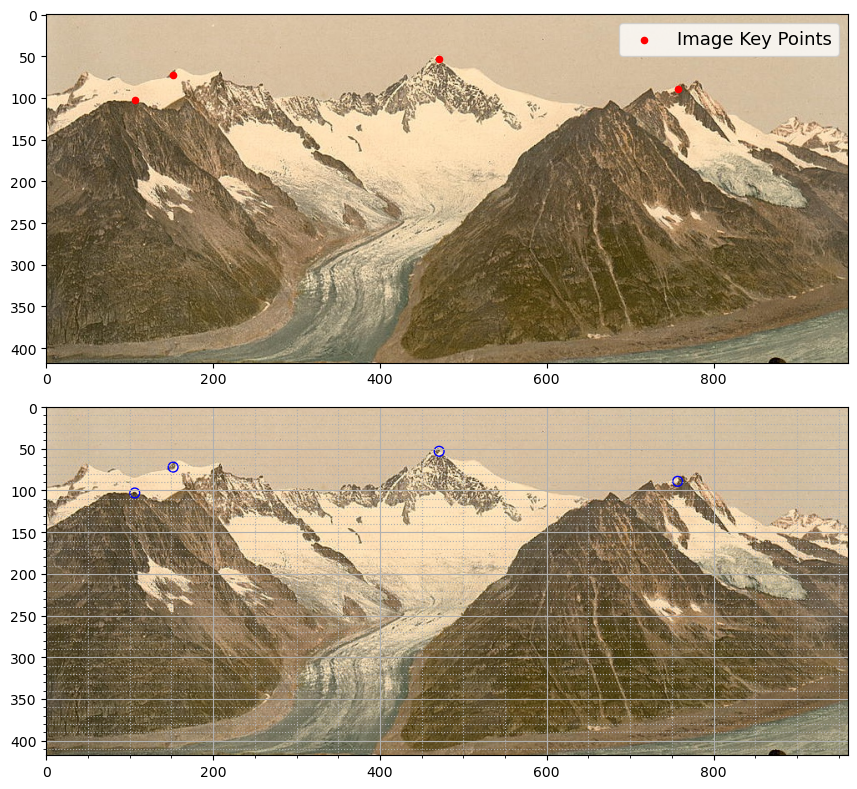

In [79]:
fig, axs = plt.subplots(2, 1, figsize=(15, 8))

showImg_and_KeyPoints(img, Selected_Image_keypoints, ax=axs[0], pointfill=True, showLegend=True, labelString='Image Key Points',
                      showPointNumber=False, showGrid=False, pointsize=20, fontsize=13, saveTofile=True, filePath='./Outputs/image_keypoints.png')

showImg_and_KeyPoints(img, Selected_Image_keypoints, ax=axs[1],
                      pointfill=False, showPointNumber=False, labelString='Keypoints 2')

plt.tight_layout()
plt.show()

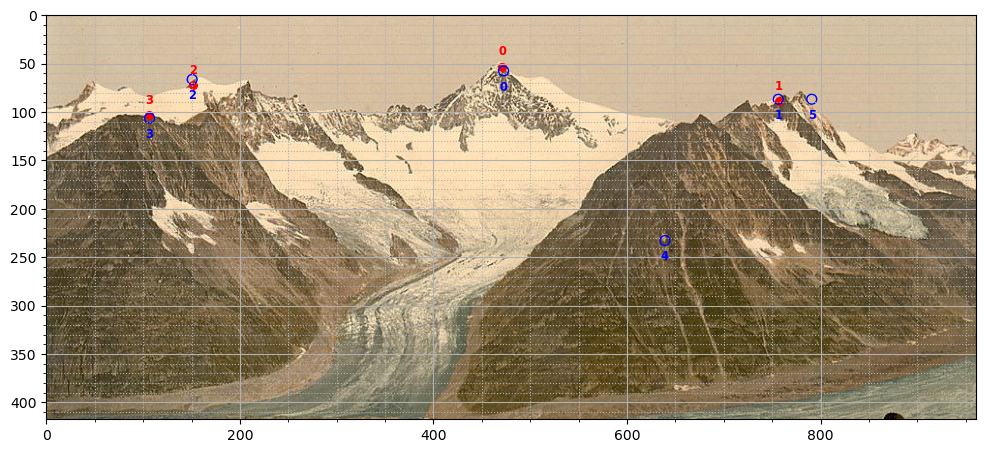

In [15]:
projectedPoints = Pmodel.uv_final.detach().numpy()
showImg_and_KeyPoints_and_projectedPoints(img, 
        Selected_Image_keypoints,
        projectedPoints,
        showPointNumber=True, pointsize=60)

In [20]:
print(Pmodel.Cam_x.detach().numpy(),',', Pmodel.Cam_y.detach().numpy(),',', Pmodel.Cam_z.detach().numpy(), ',',
      Pmodel.theta1.detach().numpy(),',', Pmodel.theta2.detach().numpy(),',', Pmodel.theta3.detach().numpy(), ',',
      Pmodel.ViewAngle.detach().numpy())

649259.635303666 , 142843.98980022082 , 2805.771429303884 , 269.9487287058334 , -62.86017190220456 , -0.4847516452659453 , 27.161234558530698


# Back Projection

In [21]:
Loc = np.array([Pmodel.Cam_x.detach().numpy(), Pmodel.Cam_y.detach().numpy(), Pmodel.Cam_z.detach().numpy()])

OCV_Angles = np.array([Pmodel.theta1.detach().numpy(), Pmodel.theta2.detach().numpy(), Pmodel.theta3.detach().numpy()])
O3D_Angles = OpenGLandCV_to_Open3D_Angles_deg(OCV_Angles)
CPose_pitch_x, CPose_heading_y, CPose_roll_z = O3D_Angles
Angles = np.array([CPose_pitch_x, CPose_heading_y, CPose_roll_z])

FOV = Pmodel.ViewAngle.detach().numpy()
# FOV = 26


pathMesh = "large-size-data/Final_refined_Mesh.stl"
FinalRefinedMesh = o3d.io.read_triangle_mesh(pathMesh)
FinalRefinedMesh.remove_duplicated_vertices()
FinalRefinedMesh.remove_duplicated_triangles()

Vertices = np.asarray(FinalRefinedMesh.vertices)
TrianglesIndex = np.asarray(FinalRefinedMesh.triangles)
Triangles = Vertices[TrianglesIndex]

CamParams, renderedIMG, depthimage = Custom_Visualizer_CameraPose_FOV_Complete(FinalRefinedMesh,
                                                      Loc[0],Loc[1],Loc[2],
                                                      Angles[0],Angles[1],Angles[2],
                                                      FOV, Pmodel.width_img, Pmodel.height_img)

renderedIMG = np.array(renderedIMG)

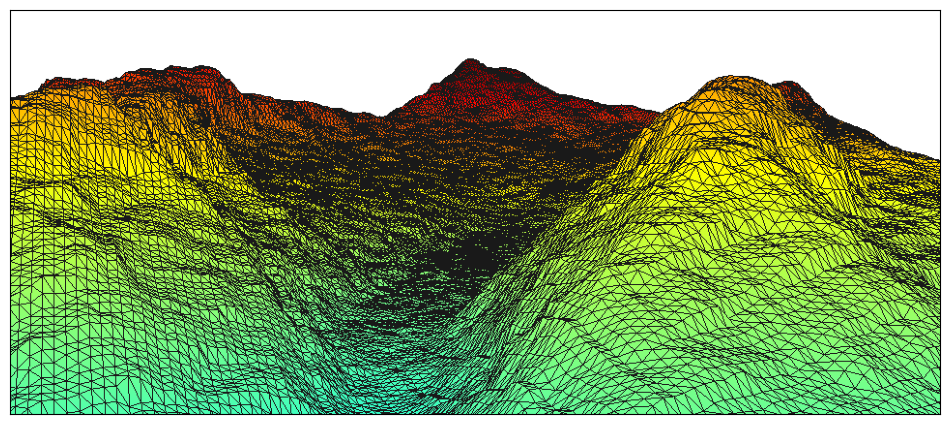

In [78]:
fig = plt.figure(figsize=(12,15))
plt.imshow(renderedIMG)
plt.xticks([])
plt.yticks([])
plt.savefig('./Outputs/renderedImage.png', bbox_inches='tight', dpi=300)
plt.show()

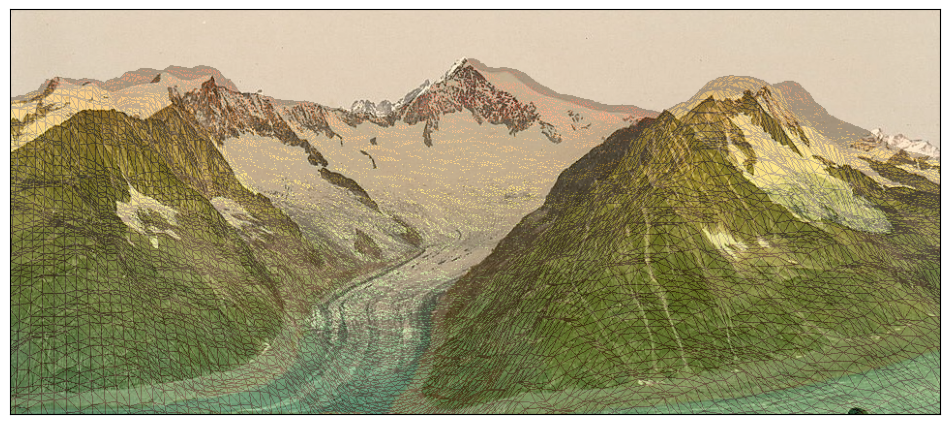

In [77]:
fig = plt.figure(figsize=(12,15))
plt.imshow(renderedIMG)
plt.imshow(img[:,:,::-1], alpha=0.75)
plt.xticks([])
plt.yticks([])
plt.savefig('./Outputs/renderedImageOverlayed.png', bbox_inches='tight', dpi=300)
plt.show()

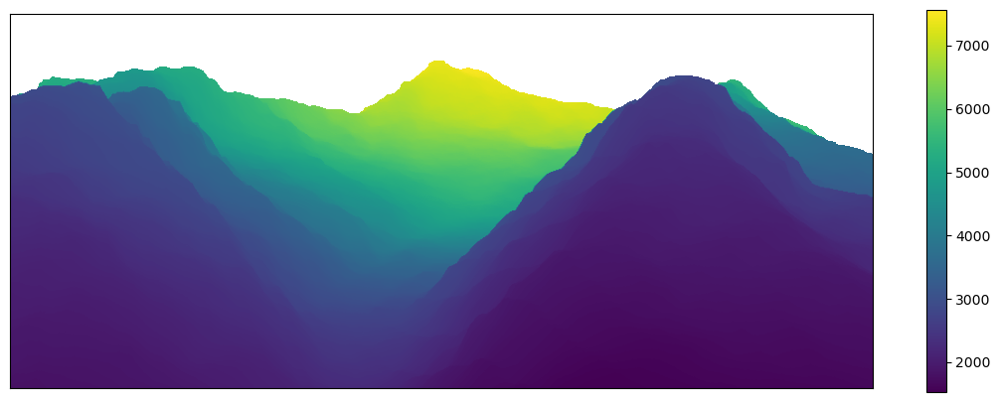

In [24]:
depthImg_nonZero = depthimage.copy()
depthImg_nonZero[depthImg_nonZero==0.0] = np.nan

fig = plt.figure(figsize=(14,5))
plt.imshow(depthImg_nonZero)
plt.colorbar()
plt.xticks([])
plt.yticks([])
plt.show()

In [25]:
u_ind, v_ind = np.where(~np.isnan(depthImg_nonZero))
uv_indices_depthImg = torch.tensor(np.hstack([v_ind.reshape(-1,1), u_ind.reshape(-1,1)]))

xyzPoints_backProj_depthImge = TorchBackProjection(uv_indices_depthImg, depthimage,
                                        Pmodel.Cam_x.detach(), Pmodel.Cam_y.detach(), Pmodel.Cam_z.detach(),
                                        Pmodel.theta1.detach(), Pmodel.theta2.detach(), Pmodel.theta3.detach(),
                                        Pmodel.ViewAngle.detach())
                                        

X_image = depthImg_nonZero.copy()
X_image[u_ind, v_ind] = xyzPoints_backProj_depthImge[:,0]

Y_image = depthImg_nonZero.copy()
Y_image[u_ind, v_ind] = xyzPoints_backProj_depthImge[:,1]

Z_image = depthImg_nonZero.copy()
Z_image[u_ind, v_ind] = xyzPoints_backProj_depthImge[:,2]

In [26]:
xyzPoints_backProj = TorchBackProjection(torch.tensor(projectedPoints), depthimage,
                                        Pmodel.Cam_x.detach(), Pmodel.Cam_y.detach(), Pmodel.Cam_z.detach(),
                                        Pmodel.theta1.detach(), Pmodel.theta2.detach(), Pmodel.theta3.detach(),
                                        Pmodel.ViewAngle.detach())
RelPErr = (abs(selectedGeoKeypoints - xyzPoints_backProj.numpy())/selectedGeoKeypoints)*100
RelPErr.mean(axis=0)

array([0.10332239, 0.44110063, 3.56959297])

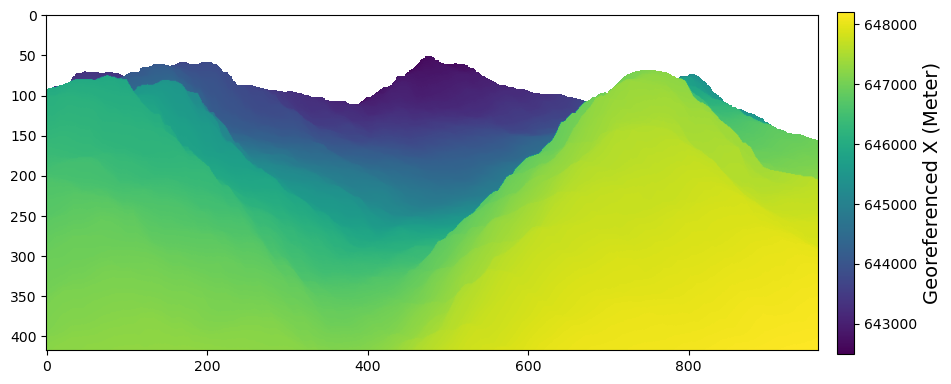

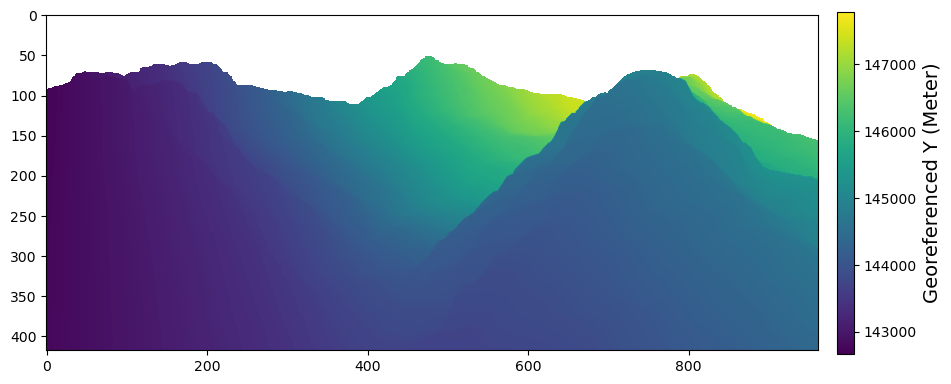

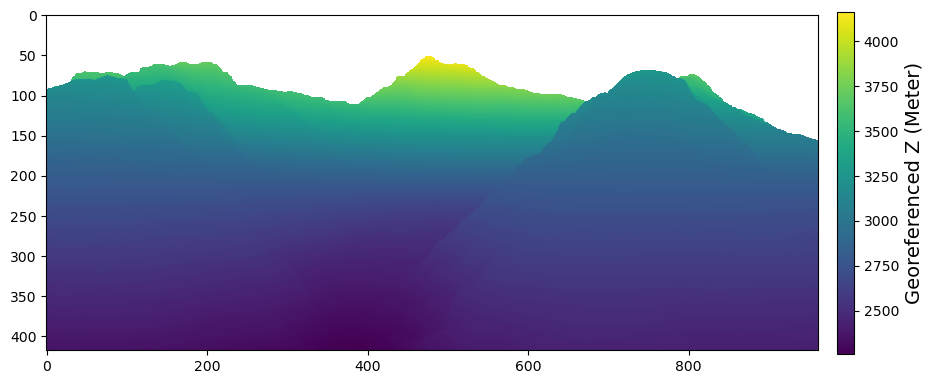

In [127]:
XYZ_images = [X_image, Y_image, Z_image]
XYZ_labels = ['X', 'Y', 'Z']
for i in range(len(XYZ_labels)):

    fig= plt.figure(figsize=(12,12))
    coordImg = XYZ_images[i]
    plt.imshow(coordImg)
    cbar = plt.colorbar(shrink=0.370, pad=0.02)
    cbar.set_label('Georeferenced '+XYZ_labels[i]+' (Meter)', rotation=90, fontsize=14)
    plt.axis('scaled')
    plt.savefig('Outputs/'+XYZ_labels[i]+'_image.png', bbox_inches='tight', dpi=300)

plt.show()

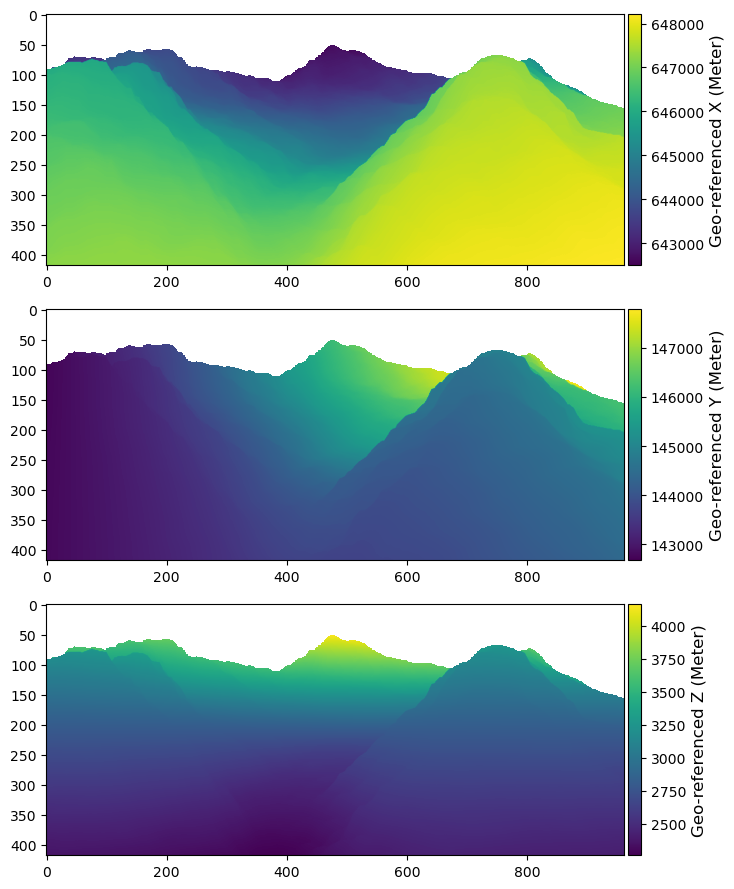

In [126]:
XYZ_images = [X_image, Y_image, Z_image]
XYZ_labels = ['X', 'Y', 'Z']

fig, axs = plt.subplots(3, 1, figsize=(7.5, 9))
for i in range(len(XYZ_labels)):

    coordImg = XYZ_images[i]
    im = axs[i].imshow(coordImg)
    cbar = plt.colorbar(im, ax=axs[i], shrink=1, pad=0)
    cbar.set_label('Geo-referenced '+XYZ_labels[i]+' (Meter)', rotation=90, fontsize=12)
    axs[i].axis('scaled')
plt.tight_layout() 
plt.savefig('Outputs/XYZ_images.png', bbox_inches='tight', dpi=300)
plt.show()


In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(17, 10))

axs[0].imshow(img[:,:,::-1])
axs[0].set_xticks([])
axs[0].set_yticks([])

axs[1].imshow(img_dst.astype(np.uint8)[:,:,::-1])
axs[1].set_xticks([])
axs[1].set_yticks([])

showImg_and_KeyPoints_and_projectedPoints(img_dst_fwd_inpaint, 
        distortedPoints_fwd,
        projectedPoints,
        showPointNumber=False, pointsize=60,
        showLegend=True,
        fontsize=13,
        saveTofile=False, ax=axs[2])

# axs[2].imshow(img_dst_fwd_inpaint[:,:,::-1])
axs[2].set_xticks([])
axs[2].set_yticks([])

plt.tight_layout()

# plt.savefig('./Outputs/Distortion.png', bbox_inches='tight', dpi=300)
plt.show()

# Monoplotting

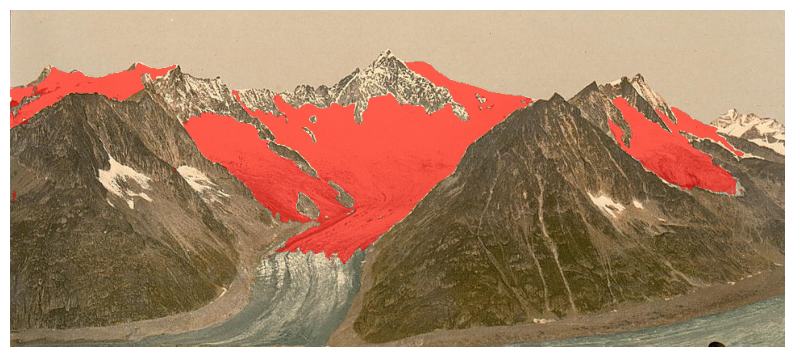

In [24]:
snowmask = np.load('data/Mountain_cropped_binaryMask_snow.npy')


plt.figure(figsize=(10,10))
plt.imshow(img[:,:,::-1])
show_mask(snowmask, plt.gca(), alpha=0.6)
plt.axis('off')
plt.savefig('Outputs/snow_segmented_mountain.png', bbox_inches='tight', dpi=300)

plt.show()

In [25]:
u_ind_snow, v_ind_snow = np.where(snowmask)
uv_indices_snow = torch.tensor(np.hstack([v_ind_snow.reshape(-1,1), u_ind_snow.reshape(-1,1)]))

xyzPoints_backProj_snow = TorchBackProjection(uv_indices_snow, depthimage,
                                        Pmodel.Cam_x.detach(), Pmodel.Cam_y.detach(), Pmodel.Cam_z.detach(),
                                        Pmodel.theta1.detach(), Pmodel.theta2.detach(), Pmodel.theta3.detach(),
                                        Pmodel.ViewAngle.detach())

In [26]:
snow_raster_pixels = GeoXYZ_to_RasterPixel(xyzPoints_backProj_snow, GDAL_GeoTransform)
raster_snowmask = np.full(DEM_DataArray.shape, False)
raster_snowmask[snow_raster_pixels[:,0], snow_raster_pixels[:,1]] = True

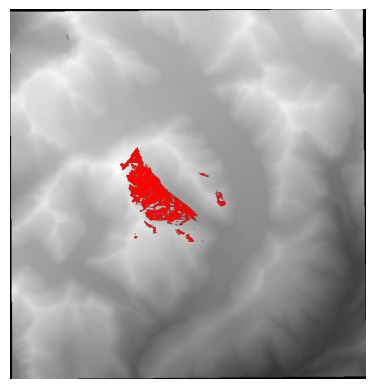

In [27]:
plt.imshow(DEM_DataArray, cmap='gray')
show_mask(raster_snowmask, plt.gca(), alpha=1)
plt.axis('scaled')
plt.axis('off')
plt.show()